In [185]:
import folium
from folium.plugins import HeatMap
from pymongo import MongoClient
from IPython.display import display


client = MongoClient("mongodb://localhost:27017/")
db = client["RideApp"]
rider_info = db["Rider_Info"]


riders = list(rider_info.find({}, {"_id": 0, "latitude": 1, "longitude": 1, "type": 1}))


vehicle_colors = {
    "car-regular": "#6495ED",  
    "car-mini": "#FF6347",  
    "auto": "#FFD700"  
}


m = folium.Map(location=[12.9716, 77.5946], zoom_start=12)

heatmap_data = [(r["latitude"], r["longitude"]) for r in riders]
HeatMap(heatmap_data, radius=12, blur=15, min_opacity=0.3).add_to(m)


for rider in riders:
    folium.CircleMarker(
        location=[rider["latitude"], rider["longitude"]],
        radius=4,
        color=vehicle_colors.get(rider["type"], "#808080"), 
        fill=True,
        fill_color=vehicle_colors.get(rider["type"], "#808080"),
        fill_opacity=0.7,
        popup=f"Type: {rider['type']}"
    ).add_to(m)


display(m)


In [186]:
import folium
from folium.plugins import HeatMap
from pymongo import MongoClient
from IPython.display import display


client = MongoClient("mongodb://localhost:27017/")
db = client["RideApp"]
rider_info = db["Users"]


riders = list(rider_info.find({}, {"_id": 0, "latitude": 1, "longitude": 1, "type": 1}))


vehicle_colors = {
    "car-regular": "#6495ED",  
    "car-mini": "#FF6347",  
    "auto": "#FFD700"  
}


m = folium.Map(location=[12.9716, 77.5946], zoom_start=12)

heatmap_data = [(r["latitude"], r["longitude"]) for r in riders]
HeatMap(heatmap_data, radius=12, blur=15, min_opacity=0.3).add_to(m)


for rider in riders:
    folium.CircleMarker(
        location=[rider["latitude"], rider["longitude"]],
        radius=4, 
        fill=True,
        fill_opacity=0.7,
        
    ).add_to(m)


display(m)


In [ ]:
import numpy as np
from sklearn.cluster import DBSCAN
import folium
from folium.plugins import MarkerCluster


rider_locations = np.array([(r["latitude"], r["longitude"]) for r in riders])


dbscan = DBSCAN(eps=0.005, min_samples=10, metric='haversine')  
labels = dbscan.fit_predict(np.radians(rider_locations)) 


for rider, label in zip(riders, labels):
    rider["cluster"] = label


cluster_map = folium.Map(location=[12.9716, 77.5946], zoom_start=12)

colors = ["red", "blue", "green", "purple", "orange", "darkred", "lightred", 
          "beige", "darkblue", "darkgreen", "cadetblue", "darkpurple", "pink"]


marker_cluster = MarkerCluster().add_to(cluster_map)

for rider in riders:
    cluster_id = rider["cluster"]
    if cluster_id == -1:
        color = "gray"  
    else:
        color = colors[cluster_id % len(colors)] 

    folium.CircleMarker(
        location=[rider["latitude"], rider["longitude"]],
        radius=4,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        popup=f"Cluster: {cluster_id}"
    ).add_to(marker_cluster)

display(cluster_map)


# Play Arena Search

In [223]:
import numpy as np
import pymongo
from sklearn.cluster import DBSCAN
from geopy.distance import great_circle

# Connect to MongoDB
client = pymongo.MongoClient("mongodb://localhost:27017/")
db = client["RideApp"]
collection = db["Rider_Info"]

documents = list(collection.find({}, {"latitude": 1, "longitude": 1, "_id": 0}))


coords = np.array([(doc["latitude"], doc["longitude"]) for doc in documents])


eps = 0.5 
dbscan = DBSCAN(eps=eps/6371, min_samples=10, metric='haversine').fit(np.radians(coords))
cluster_labels = dbscan.labels_


for i, doc in enumerate(documents):
    collection.update_one({"latitude": doc["latitude"], "longitude": doc["longitude"]}, 
                          {"$set": {"cluster": int(cluster_labels[i])}})


def classify_location(lat, lon):
    
    eps_km = 2  
    min_samples = 1
    
   
    cluster_data = list(collection.find({}, {"latitude": 1, "longitude": 1, "cluster": 1, "_id": 0}))
    
    if not cluster_data:
        return "Sparse Demand Location"  
    
   
    distances = []
    for point in cluster_data:
        dist = great_circle((lat, lon), (point["latitude"], point["longitude"])).km
        distances.append((dist, point["cluster"]))
    
   
    distances.sort()
    
    
    clusters_count = {}
    for dist, cluster in distances:
        if dist <= eps_km:
            if cluster not in clusters_count:
                clusters_count[cluster] = 0
            clusters_count[cluster] += 1
    
 
    max_count = 0
    best_cluster = -1
    for cluster, count in clusters_count.items():
        if cluster != -1 and count > max_count:
            max_count = count
            best_cluster = cluster
    
    
    if max_count >= min_samples:
        
        cluster_size = sum(1 for point in cluster_data if point["cluster"] == best_cluster)
        
        if cluster_size > 30:
            return "Dense Supply Location"
        elif cluster_size > 20:
            return "Normal Supply Location"
        else:
            return "Sparse Supply Location"
    else:
        return "Sparse Supply Location"

input_lat, input_lon = 12.9114, 77.6763
category = classify_location(input_lat, input_lon)
print(f"The input location is in a {category}.")

The input location is in a Dense Supply Location.


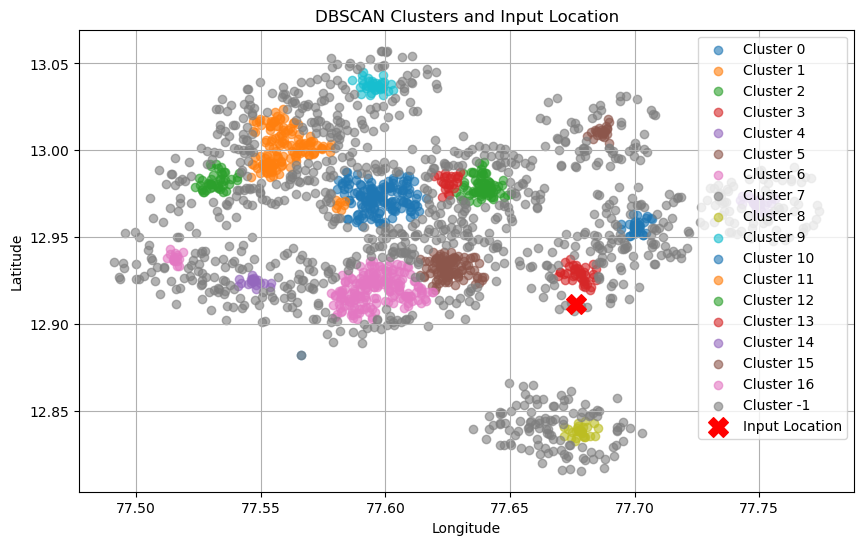

In [224]:
import numpy as np
import pymongo
import matplotlib.pyplot as plt
import folium
from sklearn.cluster import DBSCAN
from geopy.distance import great_circle
from folium.plugins import MarkerCluster


client = pymongo.MongoClient("mongodb://localhost:27017/")
db = client["RideApp"]
collection = db["Rider_Info"]


documents = list(collection.find({}, {"latitude": 1, "longitude": 1, "cluster": 1, "_id": 0}))


coords = np.array([(doc["latitude"], doc["longitude"]) for doc in documents])
clusters = np.array([doc["cluster"] for doc in documents])


input_lat, input_lon = 12.9114, 77.6763 


plt.figure(figsize=(10, 6))
unique_clusters = set(clusters)

for cluster in unique_clusters:
    cluster_points = coords[clusters == cluster]
    plt.scatter(cluster_points[:, 1], cluster_points[:, 0], label=f"Cluster {cluster}", alpha=0.6)


plt.scatter(input_lon, input_lat, color='red', marker='X', s=200, label="Input Location")

plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("DBSCAN Clusters and Input Location")
plt.legend()
plt.grid()
plt.show()


m = folium.Map(location=[input_lat, input_lon], zoom_start=12)


marker_cluster = MarkerCluster().add_to(m)


colors = ["blue", "green", "orange", "purple", "pink", "brown", "gray"]
for i, doc in enumerate(documents):
    color = "gray" if doc["cluster"] == -1 else colors[doc["cluster"] % len(colors)]
    folium.CircleMarker(
        location=(doc["latitude"], doc["longitude"]),
        radius=4,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.6
    ).add_to(marker_cluster)


folium.Marker(
    location=[input_lat, input_lon],
    popup="Input Location",
    icon=folium.Icon(color="red", icon="info-sign")
).add_to(m)

# Show the map
m


In [199]:
import numpy as np
import pymongo
from geopy.distance import great_circle

# Connect to MongoDB
client = pymongo.MongoClient("mongodb://localhost:27017/")
db = client["RideApp"]
collection = db["Rider_Info"]

# Fetch cluster data
cluster_data = list(collection.find({}, {"latitude": 1, "longitude": 1, "cluster": 1, "_id": 0}))

def classify_location(lat, lon):
    if not cluster_data:
        return 0.0, 0, 0  

    
    distances = [
        (great_circle((lat, lon), (point["latitude"], point["longitude"])).km, point["cluster"])
        for point in cluster_data
    ]
    
    
    distances.sort()

    
    drivers_within_1km = sum(1 for dist, _ in distances if dist <= 1)

    if drivers_within_1km >= 10:
        return 1.0, 1, drivers_within_1km  

   
    min_required = 10
    radius = 1 
    max_radius = 10  
    found_drivers = drivers_within_1km  

    while radius <= max_radius:
        found_drivers = sum(1 for dist, _ in distances if dist <= radius)

        if found_drivers >= min_required:
            break  # 

        radius += 1  

    
    raw_score = found_drivers / (radius ** 2) if radius > 0 else 0

    
    max_possible_score = 8  
    normalized_score = min(raw_score / max_possible_score, 1.0)  

    return normalized_score, radius, found_drivers


input_lat, input_lon = 12.9114, 77.6763 
score, radius, foundDrivers = classify_location(input_lat, input_lon)

print("SupplyScore:", float(score))
print("Radius:", radius, "km")
print("Drivers Found:", foundDrivers)


SupplyScore: 1.0
Radius: 2 km
Drivers Found: 36


In [201]:
import numpy as np
import pymongo
from geopy.distance import great_circle

# Connect to MongoDB
client = pymongo.MongoClient("mongodb://localhost:27017/")
db = client["RideApp"]
users_collection = db["Users"]

# Fetch user data
user_data = list(users_collection.find({}, {"latitude": 1, "longitude": 1, "_id": 0}))

def classify_demand(lat, lon):
    if not user_data:
        return 0.0, 0, 0  # No users available

    # Compute distances from input point to all user locations
    distances = [
        great_circle((lat, lon), (user["latitude"], user["longitude"])).km
        for user in user_data
    ]

    # Sort distances in ascending order
    distances.sort()

    # Check if at least 10 users exist within 1 km
    users_within_1km = sum(1 for dist in distances if dist <= 1)

    if users_within_1km >= 10:
        return 1.0, 1, users_within_1km  # Max score

    # Gradually expand radius until at least 10 users are found (limit to 5 km)
    min_required = 10
    radius = 1  # Start with 1 km
    max_radius = 5  # Stop at 5 km
    found_users = users_within_1km  # Track found users

    while radius <= max_radius:
        found_users = sum(1 for dist in distances if dist <= radius)

        if found_users >= min_required:
            break  # Stop expanding when 10+ users are found

        radius += 1  # Expand search radius

    # If no users found within 5 km, return 0
    if found_users < min_required:
        return 0.0, radius, found_users

    # Apply penalty: Sigmoid-based penalty to prevent extreme leniency
    penalty = 1 + np.exp(radius - 3)  

    # Adjust the raw score by dividing by the penalty
    raw_score = found_users / penalty if penalty > 0 else 0

    # Normalize the score (higher density areas get a higher max possible score)
    max_possible_score = min(10 / radius, 4)  # Dynamic scaling based on radius
    normalized_score = min(raw_score / max_possible_score, 1.0)  # Clamp between 0 and 1

    return normalized_score, radius, found_users

# Example usage
input_lat, input_lon = 12.9114, 77.6763 
demand_score, demand_radius, foundUsers = classify_demand(input_lat, input_lon)

print("DemandScore:", float(demand_score))
print("Radius:", demand_radius, "km")
print("Users Found:", foundUsers)


DemandScore: 0.0
Radius: 6 km
Users Found: 3


# Konankunte Search


In [202]:
import numpy as np
import pymongo
from sklearn.cluster import DBSCAN
from geopy.distance import great_circle

# Connect to MongoDB
client = pymongo.MongoClient("mongodb://localhost:27017/")
db = client["RideApp"]
collection = db["Rider_Info"]

documents = list(collection.find({}, {"latitude": 1, "longitude": 1, "_id": 0}))


coords = np.array([(doc["latitude"], doc["longitude"]) for doc in documents])


eps = 0.5 
dbscan = DBSCAN(eps=eps/6371, min_samples=10, metric='haversine').fit(np.radians(coords))
cluster_labels = dbscan.labels_


for i, doc in enumerate(documents):
    collection.update_one({"latitude": doc["latitude"], "longitude": doc["longitude"]}, 
                          {"$set": {"cluster": int(cluster_labels[i])}})


def classify_location(lat, lon):
    
    eps_km = 2  
    min_samples = 1
    
   
    cluster_data = list(collection.find({}, {"latitude": 1, "longitude": 1, "cluster": 1, "_id": 0}))
    
    if not cluster_data:
        return "Sparse Demand Location"  
    
   
    distances = []
    for point in cluster_data:
        dist = great_circle((lat, lon), (point["latitude"], point["longitude"])).km
        distances.append((dist, point["cluster"]))
    
   
    distances.sort()
    
    
    clusters_count = {}
    for dist, cluster in distances:
        if dist <= eps_km:
            if cluster not in clusters_count:
                clusters_count[cluster] = 0
            clusters_count[cluster] += 1
    
 
    max_count = 0
    best_cluster = -1
    for cluster, count in clusters_count.items():
        if cluster != -1 and count > max_count:
            max_count = count
            best_cluster = cluster
    
    
    if max_count >= min_samples:
        
        cluster_size = sum(1 for point in cluster_data if point["cluster"] == best_cluster)
        
        if cluster_size > 50:
            return "Dense Supply Location"
        elif cluster_size > 5:
            return "Normal Supply Location"
        else:
            return "Sparse Supply Location"
    else:
        return "Sparse Supply Location"

input_lat, input_lon = 12.8822, 77.5660 
category = classify_location(input_lat, input_lon)
print(f"The input location is in a {category}.")

The input location is in a Sparse Supply Location.


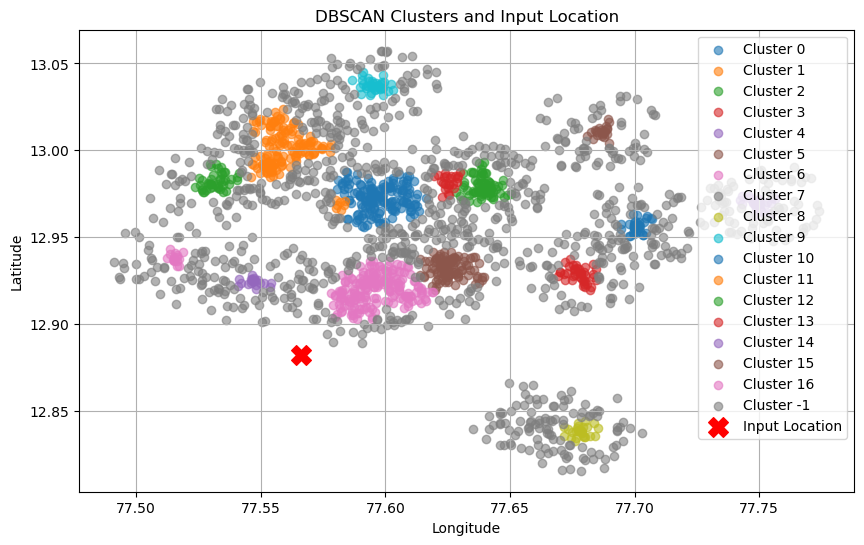

In [203]:
import numpy as np
import pymongo
import matplotlib.pyplot as plt
import folium
from sklearn.cluster import DBSCAN
from geopy.distance import great_circle
from folium.plugins import MarkerCluster


client = pymongo.MongoClient("mongodb://localhost:27017/")
db = client["RideApp"]
collection = db["Rider_Info"]


documents = list(collection.find({}, {"latitude": 1, "longitude": 1, "cluster": 1, "_id": 0}))


coords = np.array([(doc["latitude"], doc["longitude"]) for doc in documents])
clusters = np.array([doc["cluster"] for doc in documents])


input_lat, input_lon = 12.8822, 77.5660 


plt.figure(figsize=(10, 6))
unique_clusters = set(clusters)

for cluster in unique_clusters:
    cluster_points = coords[clusters == cluster]
    plt.scatter(cluster_points[:, 1], cluster_points[:, 0], label=f"Cluster {cluster}", alpha=0.6)


plt.scatter(input_lon, input_lat, color='red', marker='X', s=200, label="Input Location")

plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("DBSCAN Clusters and Input Location")
plt.legend()
plt.grid()
plt.show()


m = folium.Map(location=[input_lat, input_lon], zoom_start=12)


marker_cluster = MarkerCluster().add_to(m)


colors = ["blue", "green", "orange", "purple", "pink", "brown", "gray"]
for i, doc in enumerate(documents):
    color = "gray" if doc["cluster"] == -1 else colors[doc["cluster"] % len(colors)]
    folium.CircleMarker(
        location=(doc["latitude"], doc["longitude"]),
        radius=4,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.6
    ).add_to(marker_cluster)


folium.Marker(
    location=[input_lat, input_lon],
    popup="Input Location",
    icon=folium.Icon(color="red", icon="info-sign")
).add_to(m)

# Show the map
m


In [212]:
import numpy as np
import pymongo
from geopy.distance import great_circle

# Connect to MongoDB
client = pymongo.MongoClient("mongodb://localhost:27017/")
db = client["RideApp"]
collection = db["Rider_Info"]

# Fetch cluster data
cluster_data = list(collection.find({}, {"latitude": 1, "longitude": 1, "cluster": 1, "_id": 0}))

def classify_location(lat, lon):
    if not cluster_data:
        return 0.0, 0, 0  

    
    distances = [
        (great_circle((lat, lon), (point["latitude"], point["longitude"])).km, point["cluster"])
        for point in cluster_data
    ]
    
    
    distances.sort()

    
    drivers_within_1km = sum(1 for dist, _ in distances if dist <= 1)

    if drivers_within_1km >= 10:
        return 1.0, 1, drivers_within_1km  

   
    min_required = 10
    radius = 1 
    max_radius = 10  
    found_drivers = drivers_within_1km  

    while radius <= max_radius:
        found_drivers = sum(1 for dist, _ in distances if dist <= radius)

        if found_drivers >= min_required:
            break  # 

        radius += 1  

    
    raw_score = found_drivers / (radius ** 2) if radius > 0 else 0

    
    max_possible_score = 8  
    normalized_score = min(raw_score / max_possible_score, 1.0)  

    return normalized_score, radius, found_drivers


input_lat, input_lon = 12.8822, 77.5660 
score, radius, foundDrivers = classify_location(input_lat, input_lon)

print("SupplyScore:", float(score))
print("Radius:", radius, "km")
print("Drivers Found:", foundDrivers)


SupplyScore: 0.25
Radius: 3 km
Drivers Found: 18


In [222]:
import numpy as np
import pymongo
from geopy.distance import great_circle

# Connect to MongoDB
client = pymongo.MongoClient("mongodb://localhost:27017/")
db = client["RideApp"]
users_collection = db["Users"]

# Fetch user data
user_data = list(users_collection.find({}, {"latitude": 1, "longitude": 1, "_id": 0}))

def classify_demand(lat, lon):
    if not user_data:
        return 0.0, 0, 0  # No users available

    # Compute distances from input point to all user locations
    distances = [
        great_circle((lat, lon), (user["latitude"], user["longitude"])).km
        for user in user_data
    ]

    # Sort distances in ascending order
    distances.sort()

    # Check if at least 10 users exist within 1 km
    users_within_1km = sum(1 for dist in distances if dist <= 1)

    if users_within_1km >= 10:
        return 1.0, 1, users_within_1km  # Max score

    # Gradually expand radius until at least 10 users are found (limit to 5 km)
    min_required = 10
    radius = 1  # Start with 1 km
    max_radius = 5  # Stop at 5 km
    found_users = users_within_1km  # Track found users

    while radius <= max_radius:
        found_users = sum(1 for dist in distances if dist <= radius)

        if found_users >= min_required:
            break  # Stop expanding when 10+ users are found

        radius += 1  # Expand search radius

    # If no users found within 5 km, return 0
    if found_users < min_required:
        return 0.0, radius, found_users

    # Apply penalty: Sigmoid-based penalty to prevent extreme leniency
    penalty = 1 + np.exp(radius - 3)  

    # Adjust the raw score by dividing by the penalty
    raw_score = found_users / penalty if penalty > 0 else 0

    # Normalize the score (higher density areas get a higher max possible score)
    max_possible_score = min(10 / radius, 4)  # Dynamic scaling based on radius
    normalized_score = min(raw_score / max_possible_score, 1.0)  # Clamp between 0 and 1

    return normalized_score, radius, found_users

# Example usage
input_lat, input_lon = 12.8822, 77.5660 
demand_score, demand_radius, foundUsers = classify_demand(input_lat, input_lon)

print("DemandScore:", float(demand_score))
print("Radius:", demand_radius, "km")
print("Users Found:", foundUsers)


DemandScore: 1.0
Radius: 1 km
Users Found: 10


# Calulating the Price

## Without Supply-Demand Optimisations: The price: ₹350  -> competitors price

## Konankunte -> Supply Score: .25, Demand Score : 1 -> Konankunte Value: 0.75

## Play Arena -> Supply Score: 1, Demand Score : 0 -> Play Arena Value: -1

### Trip Value: 0.75 -(-1) = 1.75

## Our Price: ₹315 (for each ".10" points above "1" reduce price by x (x = 5))